In [ ]:
using Flight.FlightCore
using Flight.FlightLib
using Flight.FlightAircraft
using Flight.FlightAircraft.C172Z.C172ZControl
using Flight.FlightLib.Control.Continuous: LinearizedSS, submodel
using Flight.FlightLib.Control.Discrete: PIDParams
using Flight.FlightLib.Control.PIDOpt: Settings, Metrics, optimize_PID, build_PID, check_results

using UnPack
using ControlSystems
using RobustAndOptimalControl
using ComponentArrays
using LinearAlgebra
using Plots

includet("c172z_design.jl"); using .C172ZControlDesign

In [ ]:
global_search = false

aircraft = Cessna172Zv0(NED()) |> Model #linearization requires NED kinematics

h = 50
EAS = 25
flaps = C172ZControl.flaps_schedule(EAS)
payload = C172.PayloadY()
# design_point = C172.TrimParameters(; Ob = Geographic(LatLon(), HEllip(h)), EAS, flaps, payload)
design_point = C172.TrimParameters()
@show Float64(design_point.flaps)

#complete lateral model
lss_lat = get_design_model!(aircraft, design_point; model = :lat);
P_lat = named_ss(lss_lat);

x_labels_lat = keys(lss_lat.x0) |> collect
y_labels_lat = keys(lss_lat.y0) |> collect
u_labels_lat = keys(lss_lat.u0) |> collect

lss_lat.A[:ψ, :] |> display
lss_lat.A[:, :ψ] |> display
lss_lat.C[:, :ψ] |> display

ComponentVector{Float64}(p = 0.0, r = 1.0002770255010494, ψ = 1.3081583542828156e-9, φ = -8.294400071094926e-6, EAS = 8.168337235473448e-14, β = -1.9413536230514346e-7, β_filt = 0.0, ail_p = 0.0, rud_p = 0.0)

ComponentVector{Float64}(p = -5.220717654838341e-7, r = -2.390965497978126e-6, ψ = 1.3081583542828156e-9, φ = 5.5547327799677455e-8, EAS = -3.782384968212364e-7, β = -1.3550102099950868e-7, β_filt = 0.0, ail_p = 0.0, rud_p = 0.0)

ComponentVector{Float64}(p = 0.0, r = 0.0, ψ = 1.0, φ = 0.0, EAS = 0.0, β = 0.0, β_filt = 0.0, ail_p = 0.0, rud_p = 0.0, f_y = -1.2223608791828156e-8, χ = 1.0, aileron_cmd = 0.0, rudder_cmd = 0.0)

As one would expect, heading is roughly a pure integral of yaw rate. This will be a problem when
designing a LQR tracker for which the choice of command variables involves non-zero steady state yaw
rate. Since we cannot maintain constant heading with an arbitrary yaw rate, true static equilibrium
will not exist and the block $H_x F^{-1} G$ in the feedforward gain matrix required for tracking
such command variables will be singular.

This would not be an issue if we picked for instance $\chi$ and $\beta$ as command variables,
because the true equilibrium we need does exist for an arbitrary combination of the two. However,
this is not an appealing choice, because we would like to be able to control the roll axis
explicitly, rather than implicitly through $\chi$.

Since the coupling of $\psi$ into the remaining states is extremely weak, we can simply drop $\psi$
from the state, design the LQR trackers on the reduced plant, and then connect them back to the full
plant. 

In [201]:
x_labels_red = copy(x_labels_lat)
y_labels_red = copy(y_labels_lat)

x_labels_red = deleteat!(x_labels_red, findfirst(isequal(:ψ), x_labels_red))
y_labels_red = deleteat!(y_labels_red, findfirst(isequal(:ψ), y_labels_red))

#we should also remove χ because of its coupling to ψ
y_labels_red = deleteat!(y_labels_red, findfirst(isequal(:χ), y_labels_red))

lss_red = submodel(lss_lat; x = x_labels_red, u = u_labels, y = y_labels_red)
P_red = named_ss(lss_red);

In [202]:
dampreport(P_lat)
dampreport(P_red)
controllability(P_lat) |> display
controllability(P_red) |> display

(iscontrollable = true, ranks = [9, 9, 9, 9, 9, 9, 9, 9, 9], sigma_min = [0.08574493689850828, 8.087684865440814, 8.087684865440814, 4.29215504283476, 0.39337736337629825, 0.39337736337629825, 0.14113664621796898, 0.1305310409241456, 0.12957841811917778])

(iscontrollable = true, ranks = [8, 8, 8, 8, 8, 8, 8, 8], sigma_min = [0.08574493725545805, 8.087922529135215, 8.087922529135215, 4.293983783941317, 0.39342694194394406, 0.39342694194394406, 0.48874710352478545, 0.4845755601910347])

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -5.97e-06          |  1            |  5.97e-06     |  9.51e-07     |  1.67e+05     |
| -0.0227            |  1            |  0.0227       |  0.00361      |  44.1         |
| -0.0808            |  1            |  0.0808       |  0.0129       |  12.4         |
| -0.686  ±   2.69im |  0.247        |  2.77         |  0.442        |  1.46         |
| -10.5              |  1            |  10.5         |  1.66         |  0.0956       |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -50                |  1            |  50           |  7.96         |  0.02         |
|        Pole        |   Damping     |   Fr

We see that removing $\psi$ as a state eliminates an extremely slow stable pole (maybe
geodesy-related?). The remaining poles are virtually unaffected. Also, it significantly improves the
condition of the dynamics matrix:

In [203]:
cond(P_lat.A) |> display
cond(P_red.A) |> display

1.0266011124451633e8

6426.669757418409

In [ ]:
#ensure consistency in component selection and ordering between our design model
#and avionics implementation for state and control vectors
@assert tuple(x_labels_red...) === propertynames(C172ZControl.XLatRed())
# @assert tuple(u_labels_red...) === propertynames(C172ZControl.ULatRed())

x_trim_red = lss_red.x0
u_trim_red = lss_red.u0

n_x = length(x_labels_red)
n_u = length(u_labels)

2

# 1. LQR SAS

For pure stability augmentation, we must not impose aileron and rudder as command variables, because
it is not feasible to achieve a steady state for arbitrary aileron and rudder positions. Therefore,
we simply compute a suitable feedback matrix to tame the lateral modes, and leave the feedforward
matrix as a unit passthrough.

In [ ]:
#weight matrices
Q = C172ZControl.XLatRed(p = 0, r = 0.1, φ = 0.1, EAS = 0.0, β = 0, β_filt = 0, ail_p = 0, rud_p = 0) |> diagm
R = C172ZControl.ULatRed(aileron_cmd = 0.1, rudder_cmd = 0.01) |> diagm

#feedback gain matrix
C_fbk = lqr(P_red, Q, R)

#useful signal labels for connections
z_labels = [:aileron_cmd, :rudder_cmd]
z_trim = lss_red.y0[z_labels]
n_z = length(z_labels)

#passthrough feedforward
C_fwd = Matrix{Float64}(I, n_z, n_z)

#no integral control
C_int = zeros(n_u, n_z)

u_labels_fbk = Symbol.(string.(u_labels) .* "_fbk")
u_labels_fwd = Symbol.(string.(u_labels) .* "_fwd")
u_labels_sum = Symbol.(string.(u_labels) .* "_sum")
z_labels_ref = Symbol.(string.(z_labels) .* "_ref")

C_fbk_ss = named_ss(ss(C_fbk); u = x_labels_red, y = u_labels_fbk)
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_ref, y = u_labels_fwd)

#summing junctions
aileron_sum = sumblock("aileron_cmd_sum = aileron_cmd_fwd- aileron_cmd_fbk")
rudder_sum = sumblock("rudder_cmd_sum = rudder_cmd_fwd - rudder_cmd_fbk")

connections_fbk = vcat(
    Pair.(x_labels_red, x_labels_red),
    Pair.(u_labels_fbk, u_labels_fbk),
    Pair.(u_labels_fwd, u_labels_fwd),
    Pair.(u_labels_sum, u_labels),
    )

P_ar = connect([P_lat, aileron_sum, rudder_sum, C_fbk_ss, C_fwd_ss],
                connections_fbk; w1 = z_labels_ref, z1 = P_lat.y)

display(C_fbk)

2×8 Matrix{Float64}:
 0.0874957  0.089795  0.917926  0.00076509  …  0.0  0.0627199   0.000171872
 0.0470451  2.44536   0.79359   0.00163623     0.0  0.00171872  0.159993

In [206]:
dampreport(P_red)
dampreport(P_ar)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.0227            |  1            |  0.0227       |  0.00361      |  44.1         |
| -0.0808            |  1            |  0.0808       |  0.0129       |  12.4         |
| -0.686  ±   2.69im |  0.247        |  2.77         |  0.442        |  1.46         |
| -10.5              |  1            |  10.5         |  1.66         |  0.0956       |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -50                |  1            |  50           |  7.96         |  0.02         |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (r

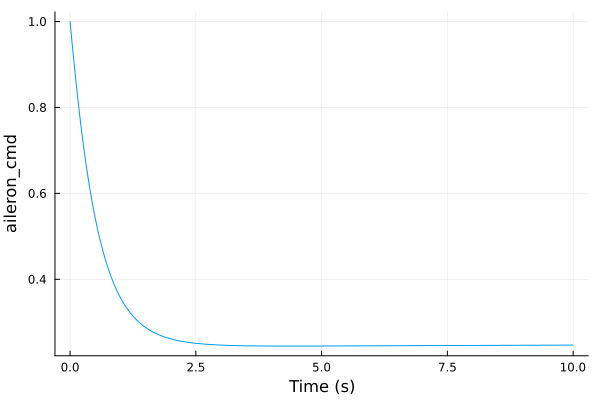

In [207]:
#aileron command reference to aileron actuator command step response (the SAS
#inhibits sustained aileron deflection)
ail2ail_ar = P_ar[:aileron_cmd, :aileron_cmd_ref]
step(ail2ail_ar, 10) |> plot

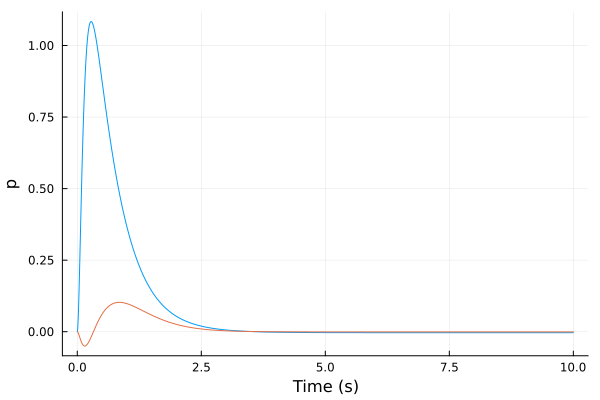

In [208]:
#aileron command reference to roll rate step response
ail2p_ar = P_ar[:p, :aileron_cmd_ref]
step(ail2p_ar, 10) |> plot
#rudder command reference to roll rate step response
rud2p_ar = P_ar[:p, :rudder_cmd_ref]
step(rud2p_ar, 10) |> plot!

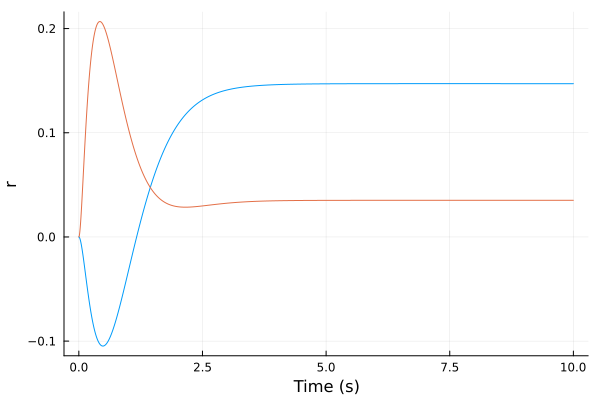

In [209]:
#aileron command reference to yaw rate step response
ail2r_ar = P_ar[:r, :aileron_cmd_ref]
step(ail2r_ar, 10) |> plot
#rudder command reference to yaw rate step response
rud2r_ar = P_ar[:r, :rudder_cmd_ref]
step(rud2r_ar, 10) |> plot!
#both inputs bank the aircraft into a turn, so a sustained yaw rate follows

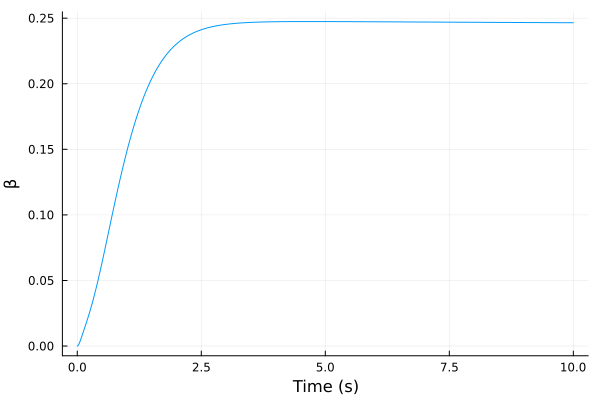

In [210]:
#no automatic turn coordination!
a2β_ar = P_ar[:β, :aileron_cmd_ref]
step(a2β_ar, 10) |> plot

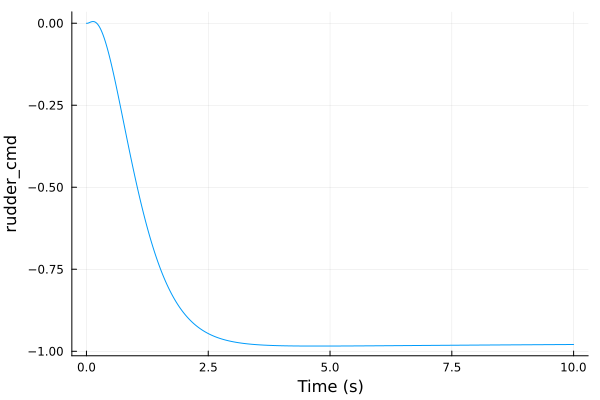

In [211]:
ail2rud_ar = P_ar[:rudder_cmd, :aileron_cmd_ref]
step(ail2rud_ar, 10) |> plot

# 2. LQR CAS

We now address the design of a MIMO lateral-directional CAS. The first question is which two
variables we should select as command variables.

Since bank angle is essentially a pure integral of roll rate, asymptotic equilibrium is only
possible for a zero steady-state roll rate. This means that selecting roll rate as
a command variable is not physically reasonable, and would likely yield a (nearly) singular feedforward matrix.

How about aileron command? Looking at the stability-augmented system's response, we see that a step
input in aileron command reference produces an initial aileron command output of 1, but then equilibrium is
achieved with a much smaller (although not zero) value. This means that achieving unit
steady-state output in the regulated system would require very large feedforward gains and would
yield an extremely high initial actuator command, well beyond 1 (at which actuator is already
saturated). That suggests aileron command isn't a good choice for a tracked variable either.

Looking at the stability-augmented system's aileron set point to bank angle response, we see that it
starts at zero and then stabilizes at a value close to 1. This suggests that $\phi$ 
would make for a good command variable. Once we have a CAS design with
$\phi$ as an input, we can add an external SISO loop to command roll rate, with the
necessary compensation to achieve zero steady state error.

Another variable we are interested in controlling explicitly is $\beta$ (or alternatively lateral
specific force, $f_y$). In most cases we want to maintain $\beta = 0$ for turn coordination, but we
might want to command non-zero values for scenarios such as cross-wind landing. If we select $\beta$ as the only
command variable, we will get a 2x1 feedforward matrix which will provide a combination of aileron
and rudder that achieves the desired steady-state $\beta$ (specifically, the optimal one in the
least-squares sense). However, we obviously also want to retain roll control. But if we add an
arbitrary external aileron command to that prescribed by the $\beta$ feedforward, we will no longer
achieve the desired steady-state $\beta$ value.


## 2.3. Design C (Integral $\phi$ and $\beta$ Control)

Just an exercise...

In [212]:
#define command variables
z_labels = [:φ, :β]
@assert tuple(z_labels...) === propertynames(C172ZControl.Zφβ())
z_trim = lss_red.y0[z_labels]
n_z = length(z_labels)

2

In [213]:
F = lss_red.A
G = lss_red.B
Hx = lss_red.C[z_labels, :]
Hu = lss_red.D[z_labels, :]
display(Hx)
display(Hu)

#define the blocks corresponding to the subset of the command variables for
#which integral compensation is required
Hx_int = Hx[z_labels, :]
Hu_int = Hu[z_labels, :]
n_int, _ = size(Hx_int)
display(Hx_int)
display(Hu_int)

F_aug = [F zeros(n_x, n_int); Hx_int zeros(n_int, n_int)]
G_aug = [G; Hu_int]
Hx_aug = [Hx zeros(n_z, n_int)]
Hu_aug = Hu

P_aug = ss(F_aug, G_aug, Hx_aug, Hu_aug)
controllability(F_aug, G_aug)

2×8 ComponentMatrix{Float64} with axes Axis(φ = 1, β = 2) × Axis(p = 1, r = 2, φ = 3, EAS = 4, β = 5, β_filt = 6, ail_p = 7, rud_p = 8)
 0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0

2×2 ComponentMatrix{Float64} with axes Axis(φ = 1, β = 2) × Axis(aileron_cmd = 1, rudder_cmd = 2)
 0.0  0.0
 0.0  0.0

2×8 ComponentMatrix{Float64} with axes Axis(φ = 1, β = 2) × Axis(p = 1, r = 2, φ = 3, EAS = 4, β = 5, β_filt = 6, ail_p = 7, rud_p = 8)
 0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0

2×2 ComponentMatrix{Float64} with axes Axis(φ = 1, β = 2) × Axis(aileron_cmd = 1, rudder_cmd = 2)
 0.0  0.0
 0.0  0.0

(iscontrollable = true, ranks = [10, 10, 10, 10, 10, 10, 10, 10, 10, 10], sigma_min = [0.08574493689896383, 8.086149037326983, 8.086149037326983, 4.290620271049921, 0.39298743098149613, 0.39298743098149613, 0.07901772811672121, 0.025464893247847627, 0.017086821202719003, 0.017086821202719003])

In [214]:
#weight matrices
Q = ComponentVector(p = 0, r = 0.1, φ = 0.25, EAS = 0, β = 5, β_filt = 0, ail_p = 0, rud_p = 0, ξ_φ = 0.1, ξ_β = 0.001) |> diagm
R = C172ZControl.ULatRed(aileron_cmd = 0.05, rudder_cmd = 0.05) |> diagm

#compute gain matrix
C_aug = lqr(P_aug, Q, R)

# quickly construct the closed-loop augmented system to check the resulting
# eigenvalues, we'll do the connections properly later
F_aug_cl = F_aug - G_aug * C_aug
P_aug_cl = ss(F_aug_cl, G_aug, Hx_aug, Hu_aug)

dampreport(P_aug)
dampreport(P_aug_cl)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| +0                 |  -1           |  0            |  0            |  -Inf         |
| +0                 |  -1           |  0            |  0            |  -Inf         |
| -0.0227            |  1            |  0.0227       |  0.00361      |  44.1         |
| -0.0808            |  1            |  0.0808       |  0.0129       |  12.4         |
| -0.686  ±   2.69im |  0.247        |  2.77         |  0.442        |  1.46         |
| -10.5              |  1            |  10.5         |  1.66         |  0.0956       |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -20                |  1            |  20           |  3.18         |  0.05         |
| -50                |  1            |  50 

In [215]:
A = [F G; Hx Hu]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]

#extract system state and integrator blocks from the feedback matrix
C_x = C_aug[:, 1:n_x]
C_ξ = C_aug[:, n_x+1:end]

C_fbk = C_x
C_fwd = B_22 + C_x * B_12
C_int = C_ξ

#some useful signal labels
u_labels_fbk = Symbol.(string.(u_labels) .* "_fbk")
u_labels_fwd = Symbol.(string.(u_labels) .* "_fwd")
u_labels_sum = Symbol.(string.(u_labels) .* "_sum")
u_labels_int_u = Symbol.(string.(u_labels) .* "_int_u")
u_labels_int = Symbol.(string.(u_labels) .* "_int")
u_labels_ξ = Symbol.(string.(u_labels) .* "_ξ")

z_labels_ref = Symbol.(string.(z_labels) .* "_ref")
z_labels_ref1 = Symbol.(string.(z_labels) .* "_ref1")
z_labels_ref2 = Symbol.(string.(z_labels) .* "_ref2")
z_labels_err = Symbol.(string.(z_labels) .* "_err")
z_labels_sum = Symbol.(string.(z_labels) .* "_sum")
z_labels_ref_fwd = Symbol.(string.(z_labels) .* "_ref_fwd")
z_labels_ref_sum = Symbol.(string.(z_labels) .* "_ref_sum")

#the integral gain matrix is constructed by padding C_ξ with zeros in those
#columns corresponding to command variables without integral compensation
C_fbk_ss = named_ss(ss(C_fbk), u = x_labels_red, y = u_labels_fbk)
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_ref_fwd, y = u_labels_fwd)
C_int_ss = named_ss(ss(C_int), u = z_labels_err, y = u_labels_int_u)

int_ss = named_ss(ss(tf(1, [1,0])) .* I(2),
                    x = u_labels_ξ,
                    u = u_labels_int_u,
                    y = u_labels_int);

φ_err_sum = sumblock("φ_err = φ_sum - φ_ref_sum")
β_err_sum = sumblock("β_err = β_sum - β_ref_sum")

aileron_cmd_sum = sumblock("aileron_cmd_sum = aileron_cmd_fwd - aileron_cmd_fbk - aileron_cmd_int")
rudder_cmd_sum = sumblock("rudder_cmd_sum = rudder_cmd_fwd - rudder_cmd_fbk - rudder_cmd_int")

φ_ref_splitter = splitter(:φ_ref, 2)
β_ref_splitter = splitter(:β_ref, 2)

connections = vcat(
    Pair.(x_labels_red, x_labels_red),
    Pair.(z_labels, z_labels_sum),
    Pair.(z_labels_ref1, z_labels_ref_sum),
    Pair.(z_labels_ref2, z_labels_ref_fwd),
    Pair.(z_labels_err, z_labels_err),
    Pair.(u_labels_sum, u_labels),
    Pair.(u_labels_fwd, u_labels_fwd),
    Pair.(u_labels_fbk, u_labels_fbk),
    Pair.(u_labels_int, u_labels_int),
    Pair.(u_labels_int_u, u_labels_int_u),
    )

display(C_fbk_ss)
display(C_fwd_ss)
display(C_int_ss)

NamedStateSpace{Continuous, Float64}
D = 
 0.22270312295355763  -0.32393288918848545  2.77373130533283    0.0011136442271462512   2.078822488389525  0.0   0.18644914112373753  -0.03691330645766349
 0.06184317217004943   2.387944028102338    0.4441660122586808  0.0002585232690441022  -5.001752846911815  0.0  -0.03691330645766349   0.16430939910831646

Continuous-time state-space model
With state  names: 
     input  names: p r φ EAS β β_filt ail_p rud_p
     output names: aileron_cmd_fbk rudder_cmd_fbk


NamedStateSpace{Continuous, Float64}
D = 
 2.685776638871259     3.507266063923044
 1.0558198717463596  -10.499057161025904

Continuous-time state-space model
With state  names: 
     input  names: φ_ref_fwd β_ref_fwd
     output names: aileron_cmd_fwd rudder_cmd_fwd


NamedStateSpace{Continuous, Float64}
D = 
 1.3407552289132014   0.044986155219337055
 0.449861552192817   -0.13407552289121755

Continuous-time state-space model
With state  names: 
     input  names: φ_err β_err
     output names: aileron_cmd_int_u rudder_cmd_int_u


After designing the LQR tracker on the reduced plant, we connect it to the full lateral dynamics to
get $\psi$ and $\chi$ back, which we will need for course angle controller design.

In [216]:
P_φβ_2int = connect([P_lat, int_ss, C_fwd_ss, C_fbk_ss, C_int_ss,
                φ_err_sum, β_err_sum,
                aileron_cmd_sum, rudder_cmd_sum,
                φ_ref_splitter, β_ref_splitter], connections;
                w1 = z_labels_ref, z1 = y_labels_lat)

dampreport(P_φβ_2int)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -1.69e-07          |  1            |  1.69e-07     |  2.69e-08     |  5.91e+06     |
| -0.0128            |  1            |  0.0128       |  0.00204      |  77.9         |
| -0.0834            |  1            |  0.0834       |  0.0133       |  12           |
| -0.644             |  1            |  0.644        |  0.103        |  1.55         |
| -2.9               |  1            |  2.9          |  0.461        |  0.345        |
| -2.68   ±   3.45im |  0.613        |  4.36         |  0.695        |  0.374        |
| -10.1              |  1            |  10.1         |  1.61         |  0.0991       |
| -19.9              |  1            |  19.9         |  3.16         |  0.0503       |
| -20                |  1            |  20 

┌ Warning: Connecting single output to multiple inputs Y1=Union{Nothing, Int64}[1, 2, 4, 5, 6, 7, 8, 9, 4, 6, 26, 28, 27, 29, 22, 23, 24, 25, 16, 17, 18, 19, 14, 15, 20, 21]
└ @ ControlSystemsBase /Users/miguel/.julia/packages/ControlSystemsBase/QP8oo/src/connections.jl:360


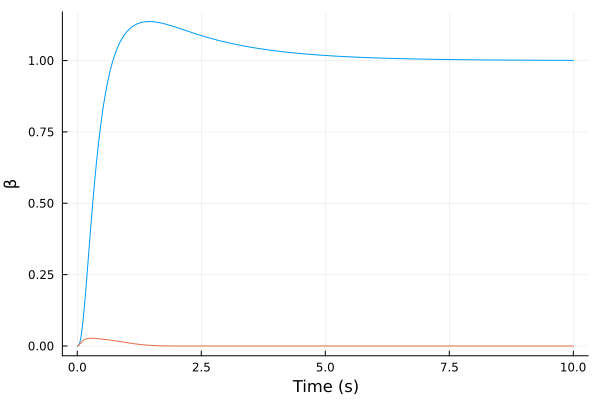

In [217]:
#bank angle reference to bank angle step response
step(P_φβ_2int[:φ, :φ_ref], 10) |> plot
#bank angle reference to sideslip angle step response (turn coordination)
step(P_φβ_2int[:β, :φ_ref], 10) |> plot!

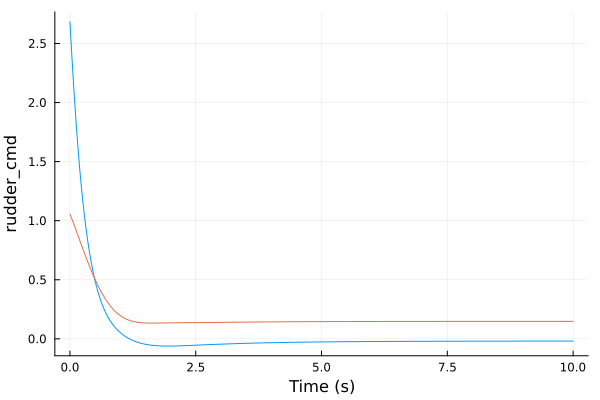

In [218]:
#bank angle reference to aileron actuator command response
step(P_φβ_2int[:aileron_cmd, :φ_ref], 10) |> plot
#bank angle reference to rudder actuator command response (anticipating adverse
#yaw, then coordinating the turn)
step(P_φβ_2int[:rudder_cmd, :φ_ref], 10) |> plot!

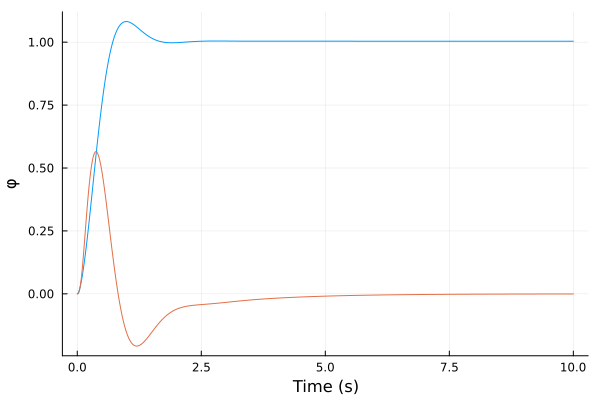

In [219]:
#sideslip angle reference to sideslip angle response
step(P_φβ_2int[:β, :β_ref], 10) |> plot
#sideslip angle reference to bank angle response (wings level crabbing)
step(P_φβ_2int[:φ, :β_ref], 10) |> plot!

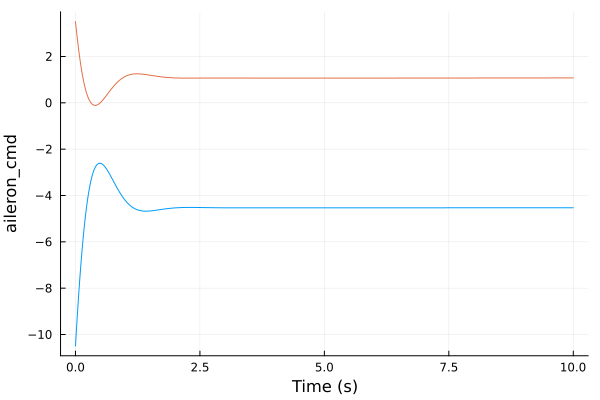

In [220]:
#sideslip angle reference to rudder actuator command response
step(P_φβ_2int[:rudder_cmd, :β_ref], 10) |> plot

#sideslip angle reference to aileron actuator command response (wings level
#crabbing requires aileron deflection)
step(P_φβ_2int[:aileron_cmd, :β_ref], 10) |> plot!

### 2.3.1. Roll Rate Control Augmentation

We now design a roll rate CAS on top of the plant with $\phi$ and $\beta$ tracking. This will be a
SISO loop connected to the $\phi_{sp}$ input. That is, we will provide roll rate tracking via the
bank angle set point. Clearly, one integrator will be needed in the feedforward path to yield a
type-0 open-loop system. And another one to achieve type 1 (zero steady-state roll rate error).

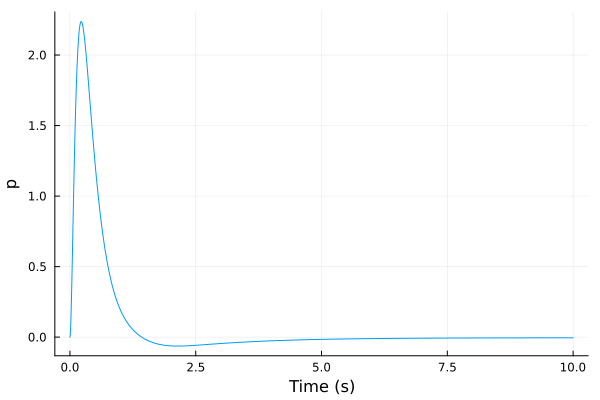

In [221]:
P_φ2p = P_φβ_2int[:p, :φ_ref];
step(P_φ2p, 10) |> plot

In [222]:
data = zpkdata(P_φ2p)
data[1] |> display
data[2] |> display
data[3] |> display

1×1 Matrix{Vector{ComplexF64}}:
 [-19.904499612995018 + 0.0im, -2.5171323511293324 + 3.350287166928568im, -2.5171323511293324 - 3.350287166928568im, -0.49003490401107386 + 0.0im, -0.08335678257218385 + 0.0im, -0.012828488736342278 + 0.0im, 0.004344410533026807 + 0.0im, -2.356070968251116e-6 + 0.0im]

1×1 Matrix{Vector{ComplexF64}}:
 [-19.981440928307265 + 0.0im, -19.883058450059742 + 0.0im, -10.094521902394517 + 0.0im, -2.896511324186225 + 0.0im, -2.6763636938866826 + 3.44742271511948im, -2.6763636938866826 - 3.44742271511948im, -0.6444689389028723 + 0.0im, -0.08335679002759667 + 0.0im, -0.012828862938616448 + 0.0im, -1.691974026968198e-7 + 0.0im]

1×1 Matrix{Float64}:
 832.411538471867

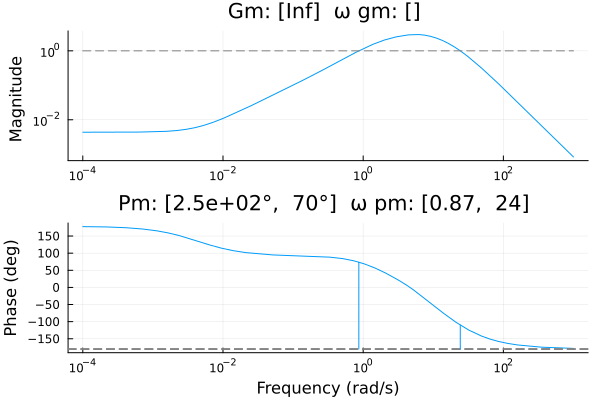

In [223]:
marginplot(P_φ2p, adjust_phase_start = false)


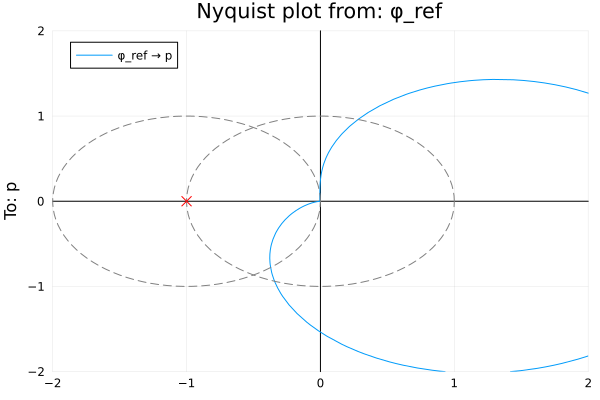

In [224]:
nyquistplot(P_φ2p; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [225]:
#the resulting design is not going to be stable (sustained roll rate is
#inherently divergent), so we should no use Ms as a performance metric. it's
#only the short term step response that we optimize for.
p2φ_int = tf(1, [1, 0]) |> ss
P_p2φ_opt = series(p2φ_int, ss(P_φ2p))

t_sim_p2φ = 10
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 10.0, k_i = 35.0, k_d = 1.5, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_p2φ, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 0, ∫e = 2, ef = 2, ∫u = 1, up = 0.00)
params_0 = PIDParams(; k_p = 1.5, k_i = 3, k_d = 0.1, τ_f = 0.01)

p2φ_results = optimize_PID(P_p2φ_opt; params_0, settings, weights, global_search)

@unpack k_p, k_i, k_d, T_i, T_d = p2φ_results.params
@unpack k_p, k_i, k_d, T_i, T_d = p2φ_results.params
@show k_p, k_i, k_d, T_i, T_d
@show p2φ_results.metrics
@show p2φ_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (1.9316615619032784, 5.994839645292081, 0.15035736888258242, 0.32222072252095474, 0.07783836042916045)
p2φ_results.metrics = [1000.0, 0.01958537849630631, 0.0009128325873269949, 0.06276602507579622, 15.967398450161518]
p2φ_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

In [226]:
p2φ_PID = build_PID(p2φ_results.params)
C_p2φ = named_ss(series(p2φ_int, p2φ_PID), :C_p2φ; u = :p_err, y = :φ_ref)

C_p2φ: NamedStateSpace{Continuous, Float64}
A = 
 -100.0  0.0  32.0
    4.0  0.0   0.0
    0.0  0.0   0.0
B = 
 0.0
 0.0
 1.0
C = 
 -46.79933903689162  4.683468472884438  16.967398450161518
D = 
 0.0

Continuous-time state-space model
With state  names: C_p2φx1 C_p2φx2 C_p2φx3
     input  names: p_err
     output names: φ_ref


StepInfo:
Initial value:     0.000
Final value:       0.999
Step size:         0.999
Peak:              1.025
Peak time:         0.609 s
Overshoot:          2.60 %
Undershoot:         0.00 %
Settling time:     0.790 s
Rise time:         0.234 s


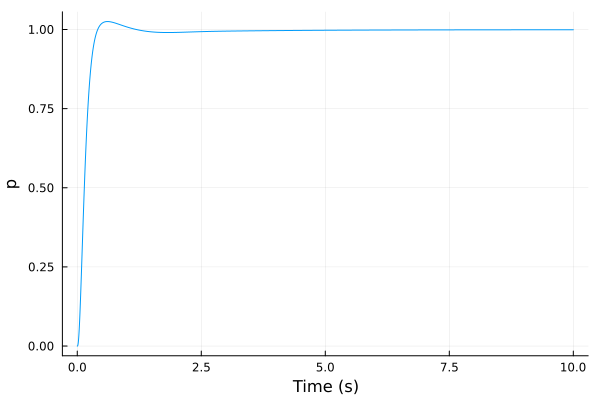

In [227]:
#closed loop transfer function
T_p2φ = output_comp_sensitivity(P_φ2p, C_p2φ)
T_p2φ_step_SISO = step(T_p2φ, t_sim_p2φ)
stepinfo(T_p2φ_step_SISO) |> display
T_p2φ_step_SISO |> plot

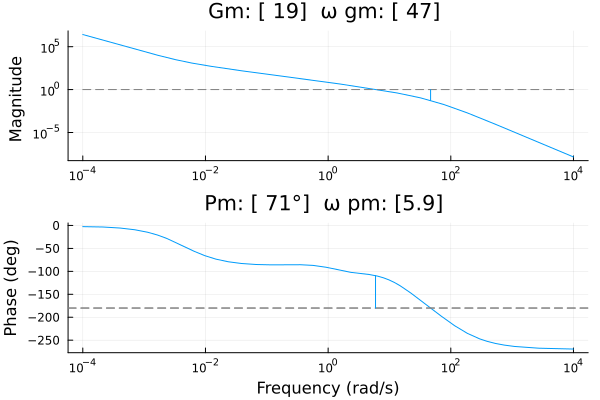

In [228]:
#loop transfer function
L_p2φ = series(C_p2φ, P_φ2p)
marginplot(L_p2φ)

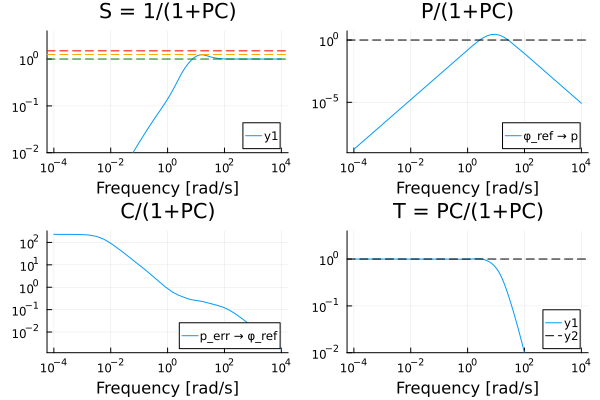

In [229]:
gangoffourplot(P_φ2p, C_p2φ)

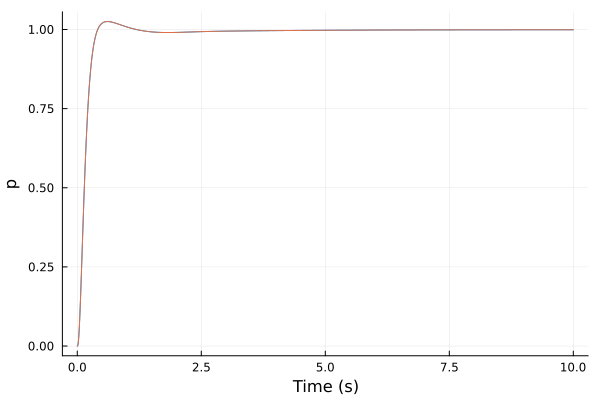

In [230]:
p2φ_sum = sumblock("p_err = p_ref - p")
P_pβ_2int = connect([P_φβ_2int, p2φ_sum, C_p2φ], [:p_err=>:p_err, :p=>:p, :φ_ref=>:φ_ref], w1 = [:p_ref, :β_ref], z1 = P_φβ_2int.y)

#cross-check SISO and MIMO responses
step(P_pβ_2int[:p, :p_ref], t_sim_p2φ) |> plot
T_p2φ_step_SISO |> plot!

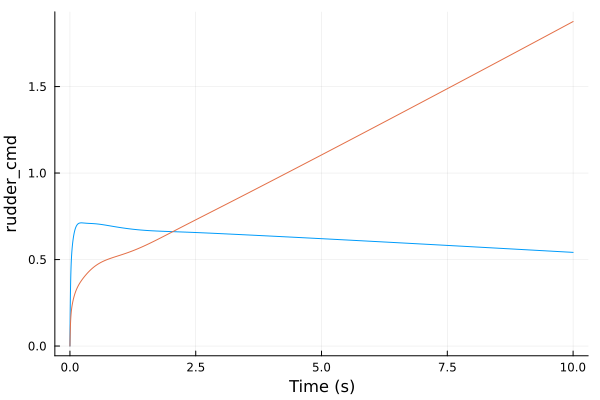

In [231]:
#roll rate to aileron and rudder actuator commands
step(P_pβ_2int[:aileron_cmd, :p_ref], t_sim_p2φ) |> plot
step(P_pβ_2int[:rudder_cmd, :p_ref], t_sim_p2φ) |> plot!

To avoid transients on mode changes, we want the initial output of the roll rate loop to match the current value of the bank angle reference at the roll-yaw SAS input, $\phi_{sp}$.

Whenever roll rate mode is enabled after a mode change, we first reset both the integrator and the PID. Then we set PID integrator's state to the appropriate value to achieve the required $\phi_{sp}$. We have:
$$ y_{int} = 0 $$
$$ y_{pid} = k_p y_{int} + k_i x_{i0} = k_i x_{i0} = \phi_{sp} $$

Therefore:
$$x_{i0} = \phi_{sp}/k_i$$

### 2.3.2. Course Angle Tracker

We start from the plant with embedded bank angle and sideslip control.

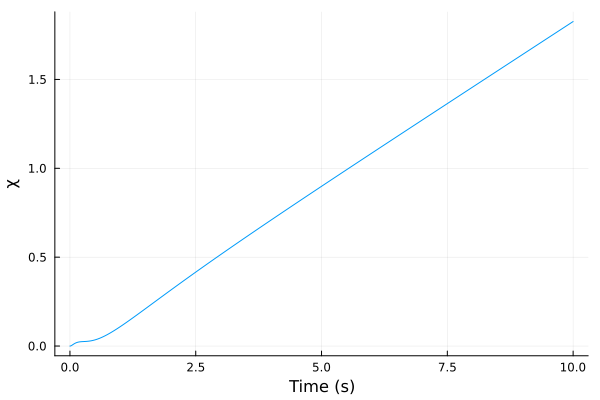

In [232]:
P_φ2χ = P_φβ_2int[:χ, :φ_ref];
step(P_φ2χ, 10) |> plot

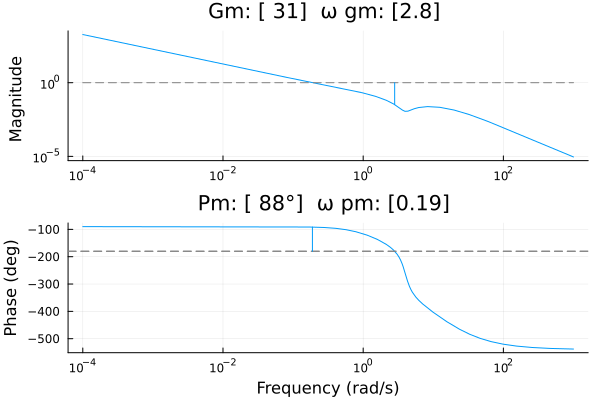

In [233]:
marginplot(P_φ2χ)

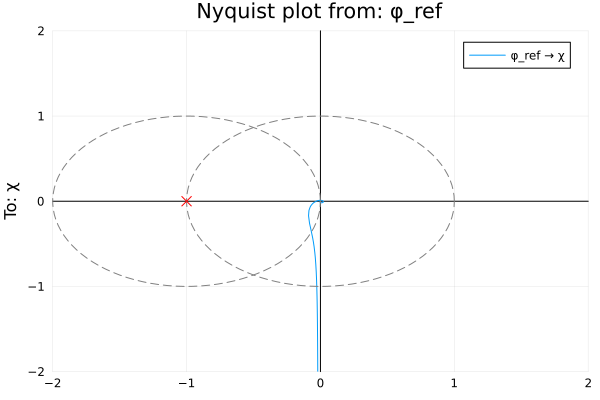

In [234]:
nyquistplot(P_φ2χ; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

We can see that without compensation the loop transfer function is already type-1, that is, gain goes to infinity for zero frequency. This ensures zero steady-state error, but not in the presence of external disturbances (such as crosswind). For zero steady-state disturbances rejection we need integral compensation. The result is a type 2 open loop system.

In [235]:
t_sim_χ2φ = 30
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.3, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 10.0, k_i = 0.3, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_χ2φ, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 3, ∫e = 10, ef = 1, ∫u = 0.00, up = 0.01)
params_0 = PIDParams(; k_p = 3., k_i = 0.3, k_d = 0.0, τ_f = 0.01)


χ2φ_results = optimize_PID(P_φ2χ; params_0, settings, weights, global_search)
χ2φ_PID = build_PID(χ2φ_results.params)
C_χ2φ = named_ss(χ2φ_PID, :C_χ2φ; u = :χ_err, y = :φ_ref);

@unpack k_p, k_i, k_d, T_i, T_d = χ2φ_results.params
@show k_p, k_i, k_d, T_i, T_d
@show χ2φ_results.metrics
@show χ2φ_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (2.8679930286006394, 0.3, 0.0, 9.559976762002131, 0.0)
χ2φ_results.metrics = [1.276743921194223, 0.09638798886175395, 0.008140649452768267, 0.975115019656054, 1.8685983427041375]
χ2φ_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

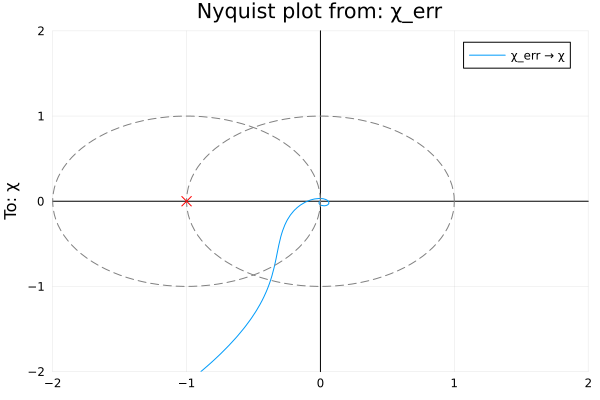

In [236]:
L_χ2φ = series(C_χ2φ, P_φ2χ)
nyquistplot(L_χ2φ, unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

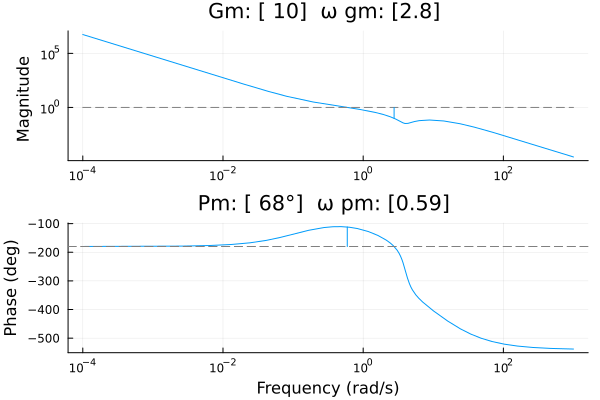

In [237]:
marginplot(L_χ2φ)

Here we are particularly interested in the load disturbance to output transfer function P/(1+C). In order for the controller to be able to counter the effects of crosswind, this function needs to show low frequency roll-off. And indeed, forcing a nonzero integral term in the PID achieves this goal.

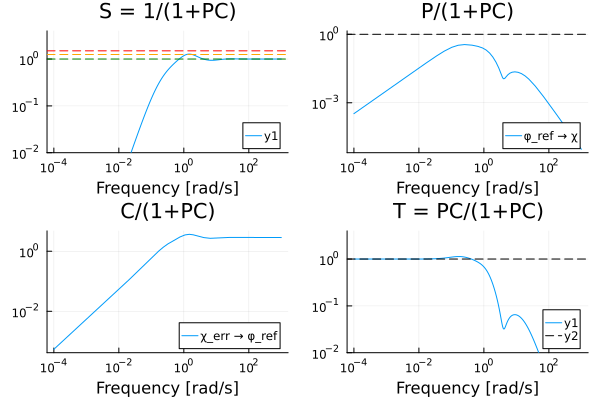

In [238]:
gangoffourplot(P_φ2χ, C_χ2φ)

StepInfo:
Initial value:     0.000
Final value:       1.000
Step size:         1.000
Peak:              1.107
Peak time:         7.732 s
Overshoot:         10.66 %
Undershoot:         0.00 %
Settling time:    23.553 s
Rise time:         2.054 s


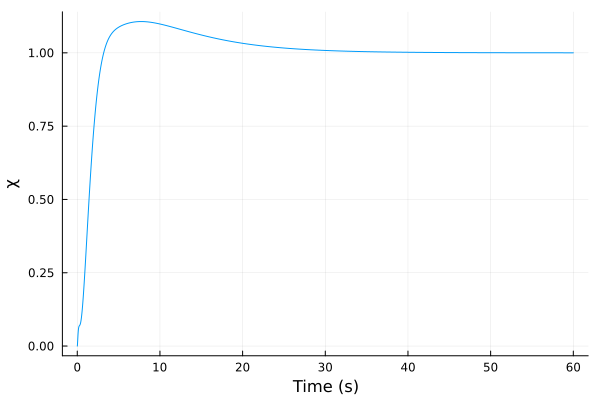

In [239]:
T_χ2φ = output_comp_sensitivity(P_φ2χ, C_χ2φ) #input to output response
T_χ2φ_step_SISO = step(T_χ2φ, 2t_sim_χ2φ)
stepinfo(T_χ2φ_step_SISO) |> display
T_χ2φ_step_SISO |> plot

The drawback of integral action in this case is the relatively large overshoot. However, here we
need to consider the input to control signal response, because unlike in the linear model, our
actual bank angle demand will be limited. In this case, saturation should work in our favor. For
large initial step responses, the anti-windup will halt integration before the integrator's state
reaches the values predicted by the linear model. Therefore, for large changes in reference input,
the actual overshoot should be smaller than predicted here.

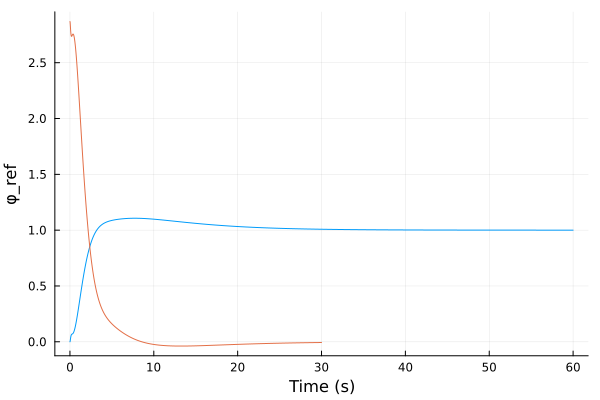

In [240]:
#course angle reference (input) to bank angle (output) response
CS_χ2φ = G_CS(P_φ2χ, C_χ2φ)
CS_χ2φ_step = step(CS_χ2φ, t_sim_χ2φ)
CS_χ2φ_step |> plot!

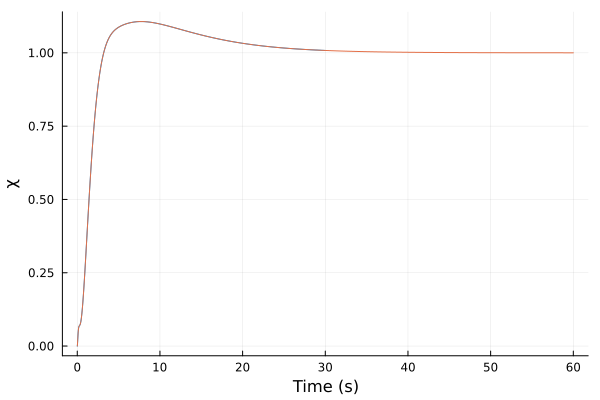

In [241]:
χ2φ_sum = sumblock("χ_err = χ_ref - χ")
P_χβ_2int = connect([P_φβ_2int, χ2φ_sum, C_χ2φ], [:χ_err=>:χ_err, :χ=>:χ, :φ_ref=>:φ_ref], w1 = [:χ_ref, :β_ref], z1 = P_φβ_2int.y)

#cross-check SISO and MIMO responses
step(P_χβ_2int[:χ, :χ_ref], t_sim_χ2φ) |> plot
T_χ2φ_step_SISO |> plot!

To avoid transients on mode changes, we want the initial output of the course angle loop to match the current value of the bank angle reference at the roll-yaw SAS input, $\phi_{sp}$.

Whenever $\chi2\phi$ is enabled after a mode change, we reset the PID. Then we set the PID integrator's state to the appropriate value to achieve the required $\phi$. We have:
$$ y_{pid} = k_p (\chi_{sp} - \chi) + k_i x_{i0} = k_i x_{i0} $$
$$ \phi_{sp} = y_{pid}$$

Therefore:
$$x_{i0} = y_{pid} / k_i = \phi_{sp}/k_i = \phi/k_i$$